# Gradient Descent

In [ ]:
## IMPORT
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D  
from matplotlib.colors import LogNorm
import time
from matplotlib.gridspec import GridSpec

%load_ext autoreload
%autoreload 1
%aimport plot_utils
%aimport algorithms
%aimport surfaces

The autoreload extension is already loaded. To reload it, use:
  %reload_ext autoreload


## 1 - Add the ADAmax algorithm

AdaMAX algorithm implementation can be found in file ```algorithms.py```

## 2 - Show a quantitative statistical comparison of the performance of different algorithms:
### - Vanilla gradient descent
### - Gradient descent with momentum
### - Nesterov
### - RMSprop
### - ADAM

### 2.1 Definition and plot of the surface for the analysis
$$
\textit{golf\_hole}(x,y)= \dots
$$

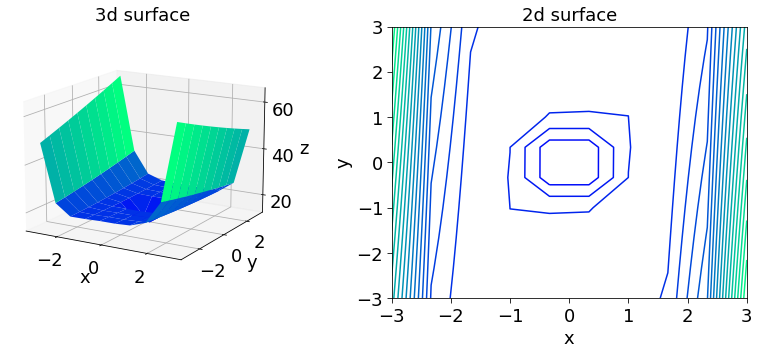

In [ ]:
## GRID
x = np.linspace(-3, 3, 10)
y = np.linspace(-3, 3, 10)
X, Y = np.meshgrid(x, y)

# SURFACE
Z = surfaces.golf_hole(X, Y)

## PLOTS
fig = plt.figure(figsize=(14,5))
colormap ='winter'

# 3d plot
ax1 = plot_utils.plot_surf_3d(
    X, Y, Z, fig, 
    subplot_id = 121, 
    elev       = 15, 
    azim       = -60,
    cmap       = colormap, 
    title      = "3d surface"
)

# 2d plot
ax2 = plot_utils.plot_surf_2d(
    X, Y, Z, fig, 
    subplot_id = 122, 
    levels     = 20,
    cmap       = colormap, 
    title      = "2d surface"
)

### 2.2 Minimization
Perform a minimization starting from
each of the points in the grid, and compute the
average value of the function vs time
during these minimizations, for each
method

In [ ]:
"""
idea: test each algo and set typical value of params in a datastructure with names of algos as keys
      and as params n_epochs, eta, algo_params for which the specific algo converges
"""  
## test to look for a good value for eta

# set initial point
min_init_grid = -3
max_init_grid = 3


np.random.seed(20220306) # today's date
init = np.random.random(size=2)*(max_init_grid-min_init_grid)+min_init_grid

algos        = ["vanilla_gd", "gd_with_mom", "nesterov", "rms_prop", "adam"]
trajectories = []
times        = []
etas         = []

## VANILLA GRADIENT DESCENT

n_epochs_ = 10**5
eta_      = 10**-2

traj_, times_ = algorithms.gd(
    grad      = surfaces.golf_hole_grad, 
    init      = init, 
    n_epochs  = n_epochs_,
    eta       = eta_,
    TIME_FLAG = 1
)
trajectories.append(traj_)
times.append(times_)
etas.append(eta_)

## GRADIENT DESCENT WITH MOMENTUM

n_epochs_ = 10**5
eta_      = 10**-3

traj_, times_ = algorithms.gd_with_mom(
    grad      = surfaces.golf_hole_grad, 
    init      = init, 
    n_epochs  = n_epochs_,
    eta       = eta_,
    TIME_FLAG = 1
)
trajectories.append(traj_)
times.append(times_)
etas.append(eta_)

## NESTOROV

n_epochs_ = 10**5
eta_      = 10**-3

traj_, times_ = algorithms.NAG(
    grad      = surfaces.golf_hole_grad, 
    init      = init, 
    n_epochs  = n_epochs_,
    eta       = eta_,
    TIME_FLAG = 1
)
trajectories.append(traj_)
times.append(times_)
etas.append(eta_)

## RMS prop

n_epochs_ = 10**5
eta_      = 10**-2

traj_, times_ = algorithms.rms_prop(
    grad      = surfaces.golf_hole_grad, 
    init      = init, 
    n_epochs  = n_epochs_,
    eta       = eta_,
    TIME_FLAG = 1
)
trajectories.append(traj_)
times.append(times_)
etas.append(eta_)

## ADAM

n_epochs_ = 10**5
eta_      = 10**-1

traj_, times_ = algorithms.adam(
    grad      = surfaces.golf_hole_grad, 
    init      = init, 
    n_epochs  = n_epochs_,
    eta       = eta_,
    TIME_FLAG = 1
)
trajectories.append(traj_)
times.append(times_)
etas.append(eta_)


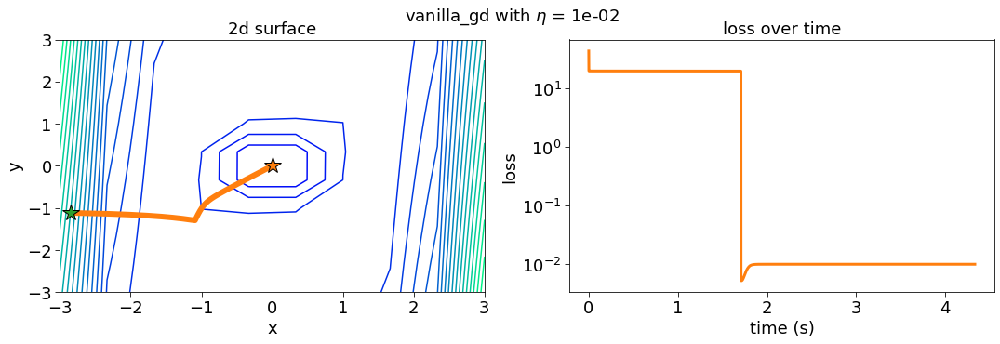

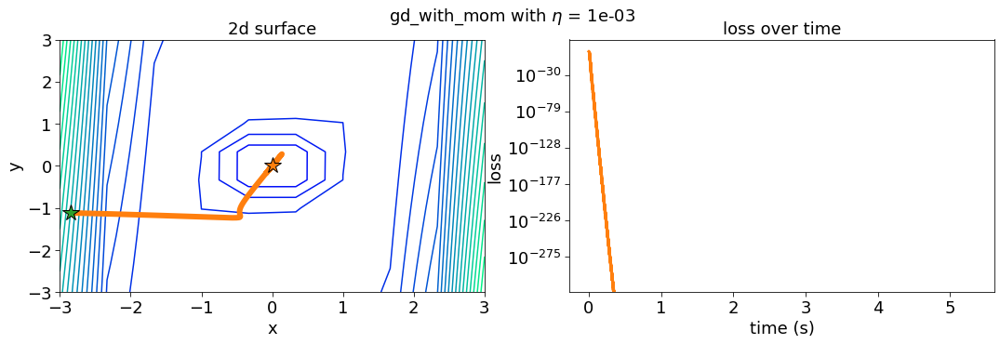

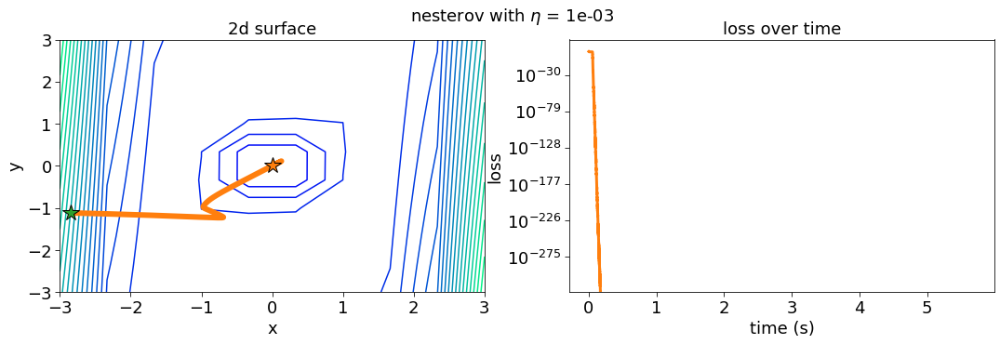

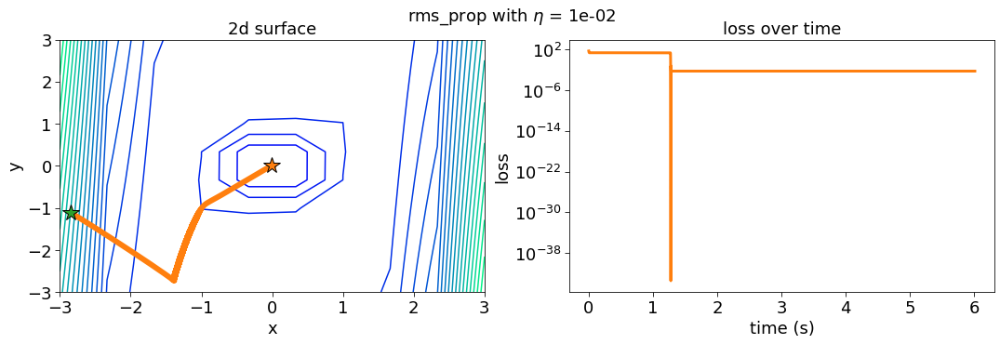

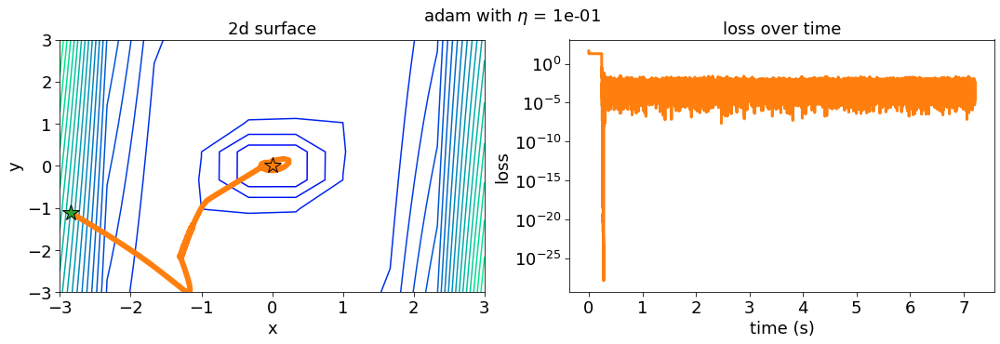

In [ ]:
## RESULTS

colormap ='winter'

for i in range(len(algos)):

    fig = plt.figure(figsize=(18,5))
    plt.suptitle(r"%s with $\eta$ = %.0e"%(algos[i], etas[i]), fontsize=18)

    # 2d plot
    ax2 = plot_utils.plot_surf_2d(
        X, Y, Z, fig, 
        subplot_id = 121, 
        levels     = 20,
        cmap       = colormap, 
        title      = "2d surface"
    )

    plot_utils.overlay_trajectory_2d(
        ax         = ax2, 
        trajectory = trajectories[i], 
        color      = "tab:orange",
        color_i    = "tab:green", 
        color_f    = "tab:orange",
        lw         = 6,
        show_i     = True,
    )

    # plot loss
    plot_utils.plot_loss(
        loss       = surfaces.golf_hole(trajectories[i][:,0], trajectories[i][:,1]),   
        fig        = fig,          
        subplot_id = 122,
        color      = "tab:orange", 
        title      = "loss over time", 
        TIME_FLAG  = 1,
        times      = times[i]
    )


In [ ]:
"""
WORK IN PROGRESS ->

idea: run algos for each point in the grid and plot avg traj vs time
"""  
algos        = ["vanilla_gd", "gd_with_mom", "nesterov", "rms_prop", "adam"]
avg_loss     = []
times        = []

n_epochs_ = 10**5

## VANILLA GRADIENT DESCENT

algos_idx = 0

avg_loss_  = np.zeros(n_epochs_+1)
for i in range(len(x)):
    for j in range(len(y)):
        init = [x[i], y[j]]
        traj_, times_ = algorithms.gd(
            grad      = surfaces.golf_hole_grad, 
            init      = init, 
            n_epochs  = n_epochs_,
            eta       = etas[algos_idx],
            TIME_FLAG = 1
        )
        avg_loss_ += np.array(surfaces.golf_hole(traj_[:,0], traj_[:,1]))/(len(x)*len(y))
        
avg_loss.append(avg_loss_)
times.append(times_)
algos_idx = algos_idx+1

## GRADIENT DESCENT WITH MOMENTUM

avg_loss_  = np.zeros(n_epochs_+1)
for i in range(len(x)):
    for j in range(len(y)):
        init = [x[i], y[j]]
        traj_, times_ = algorithms.gd_with_mom(
            grad      = surfaces.golf_hole_grad, 
            init      = init, 
            n_epochs  = n_epochs_,
            eta       = etas[algos_idx],
            TIME_FLAG = 1
        )
        avg_loss_ += np.array(surfaces.golf_hole(traj_[:,0], traj_[:,1]))/(len(x)*len(y))
        
avg_loss.append(avg_loss_)
times.append(times_)
algos_idx = algos_idx+1

## NESTOROV

avg_loss_  = np.zeros(n_epochs_+1)
for i in range(len(x)):
    for j in range(len(y)):
        init = [x[i], y[j]]
        traj_, times_ = algorithms.NAG(
            grad      = surfaces.golf_hole_grad, 
            init      = init, 
            n_epochs  = n_epochs_,
            eta       = etas[algos_idx],
            TIME_FLAG = 1
        )
        avg_loss_ += np.array(surfaces.golf_hole(traj_[:,0], traj_[:,1]))/(len(x)*len(y))
        
avg_loss.append(avg_loss_)
times.append(times_)
algos_idx = algos_idx+1

## RMS prop

avg_loss_  = np.zeros(n_epochs_+1)
for i in range(len(x)):
    for j in range(len(y)):
        init = [x[i], y[j]]
        traj_, times_ = algorithms.rms_prop(
            grad      = surfaces.golf_hole_grad, 
            init      = init, 
            n_epochs  = n_epochs_,
            eta       = etas[algos_idx],
            TIME_FLAG = 1
        )
        avg_loss_ += np.array(surfaces.golf_hole(traj_[:,0], traj_[:,1]))/(len(x)*len(y))
        
avg_loss.append(avg_loss_)
times.append(times_)
algos_idx = algos_idx+1

## ADAM

avg_loss_  = np.zeros(n_epochs_+1)
for i in range(len(x)):
    for j in range(len(y)):
        init = [x[i], y[j]]
        traj_, times_ = algorithms.adam(
            grad      = surfaces.golf_hole_grad, 
            init      = init, 
            n_epochs  = n_epochs_,
            eta       = etas[algos_idx],
            TIME_FLAG = 1
        )
        avg_loss_ += np.array(surfaces.golf_hole(traj_[:,0], traj_[:,1]))/(len(x)*len(y))
        
avg_loss.append(avg_loss_)
times.append(times_)

KeyboardInterrupt: 

In [ ]:
## RESULTS
colormap ='winter'

for i in range(len(algos)):

    fig = plt.figure(figsize=(18,5))
    plt.title(r"%s with $\eta$ = %.0e"%(algos[i], etas[i]), fontsize=18)

    # plot average loss
    plot_utils.plot_loss(
        loss       = avg_loss[i],   
        fig        = fig,          
        color      = "tab:orange", 
        title      = "loss over time", 
        TIME_FLAG  = 1,
        times      = times[i]
    )


## 3 - For a simple function, show an example where ADAM algorithm starts to become unstable with respect to a minimum that was reached at some earlier iteration t.

### Test with a simple paraboloid surface

In [ ]:
## GRID
x = np.linspace(-5, 5, 100)
y = np.linspace(-5, 5, 100)
X, Y = np.meshgrid(x, y)

# SURFACE
Z = surfaces.paraboloid(X, Y)

## ADAM ALGORITHM

# set initial point
min_init_grid = -4
max_init_grid = 4


np.random.seed(20220306) # today's date
init = np.random.random(size=2)*(max_init_grid-min_init_grid)+min_init_grid

n_epochs_adam = 5 * 10**3
eta_adam      = 1 * 10**-1
beta1_adam    = 0.90
beta2_adam    = 0.99

traj_adam    = algorithms.adam(
    grad     = surfaces.paraboloid_grad, 
    init     = init, 
    n_epochs = n_epochs_adam,
    eta      = eta_adam,
    gamma    = beta1_adam,
    beta     = beta2_adam,
)

## ADAMAX ALGORITHM

n_epochs_adamax = 5 * 10**3
alpha_adamax    = 1 * 10**-3
beta1_adamax    = 0.90
beta2_adamax    = 0.99

traj_adamax  = algorithms.adamax(
    grad     = surfaces.paraboloid_grad, 
    init     = init, 
    n_epochs = n_epochs_adamax,
    alpha    = alpha_adamax,
    beta1    = beta1_adamax,
    beta2    = beta2_adamax,
)

## LOSSES

loss_adam   = surfaces.paraboloid(traj_adam[:,0],   traj_adam[:,1])
loss_adamax = surfaces.paraboloid(traj_adamax[:,0], traj_adamax[:,1])

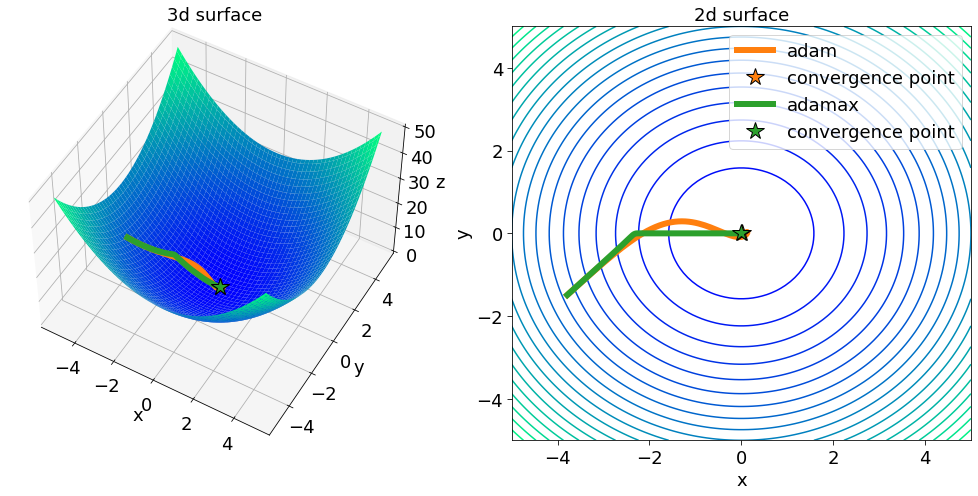

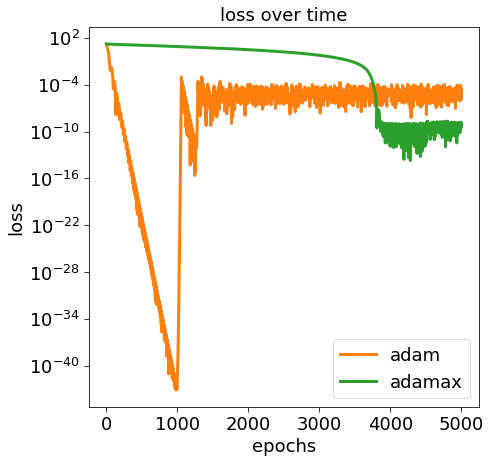

In [ ]:
## PLOT SURFACE AND TRAJECTORY

colormap = "winter"

fig = plt.figure(figsize=(14,7))

ax1 = plot_utils.plot_surf_3d(
    X, Y, Z, fig, 
    subplot_id = 121, 
    elev       = 50, 
    cmap       = colormap, 
    title      = "3d surface"
)

plot_utils.overlay_trajectory_3d(
    ax         = ax1, 
    surface    = surfaces.paraboloid, 
    trajectory = traj_adam, 
    color      = "tab:orange", 
    color_i    = "tab:green", 
    color_f    = "tab:orange", 
    lw         = 6, 
    show_i     = False,
    label      = "adam"
)
plot_utils.overlay_trajectory_3d(
    ax         = ax1, 
    surface    = surfaces.paraboloid, 
    trajectory = traj_adamax, 
    color      = "tab:green", 
    color_i    = "tab:green", 
    color_f    = "tab:green", 
    lw         = 6, 
    show_i     = False,
    label      = "adamax"
)

ax2 = plot_utils.plot_surf_2d(
    X, Y, Z, fig, 
    subplot_id = 122, 
    levels     = 20,
    cmap       = colormap, 
    title      = "2d surface"
)

plot_utils.overlay_trajectory_2d(
    ax         = ax2, 
    trajectory = traj_adam, 
    color      = "tab:orange",
    color_i    = "tab:green", 
    color_f    = "tab:orange",
    lw         = 6,
    show_i     = False,
    label      = "adam",
)
plot_utils.overlay_trajectory_2d(
    ax         = ax2, 
    trajectory = traj_adamax, 
    color      = "tab:green",
    color_i    = "tab:green", 
    color_f    = "tab:green",
    lw         = 6,
    show_i     = False,
    label      = "adamax",
)
ax2.legend(fontsize=18)

fig.tight_layout()
plt.show()

fig = plt.figure(figsize=(7,7))

ax  = plot_utils.plot_loss(
    loss=loss_adam,   
    n_epochs=n_epochs_adam, fig=fig,          
    color="tab:orange", 
    title="loss over time", 
    label="adam"
)
ax  = plot_utils.plot_loss(
    loss=loss_adamax, 
    n_epochs=n_epochs_adamax, 
    fig=fig, 
    axes=ax, 
    color="tab:green",  
    title="loss over time", 
    label="adamax"
)

ax.legend(fontsize=18)
plt.show()

### Test with a weird paraboloid surface

Everything seems to work fine, let's try now changing the surface, from a paraboloid to a more complex one, with non trivial minima distribution:
$$
f = 1+\frac{1}{2}q(x^2+y^2)-\cos[2\pi(xy-y^2)]
$$

In [ ]:
## GRID
x = np.linspace(-5, 5, 100)
y = np.linspace(-5, 5, 100)
X, Y = np.meshgrid(x, y)

# SURFACE
q = 5
Z = surfaces.weird_paraboloid(X, Y, q)

#### ADAM ALGORITHM

# set initial point
min_init_grid = -4
max_init_grid = 4

# np.random.seed(666)
init = np.random.random(size=2)*(max_init_grid-min_init_grid)+min_init_grid
init_broken_1 = [3.05391051, 0.39327105] # this starting point shows broken adam

# algorithm parameters

n_epochs = 3 * 10**3
eta      = 10**-1

# beta1, beta2 ----> 1  ==>  adam is drunk
# beta1, beta2 ~ 0.9    ==>  adam is smart
beta1    = 0.90 # default 0.90
beta2    = 0.99 # default 0.99

traj = algorithms.adam(
    grad     = surfaces.weird_paraboloid_grad, 
    init     = init_broken_1, # check this argument 
    n_epochs = n_epochs,
    eta      = eta,
    gamma    = beta1,
    beta     = beta2
)

loss = surfaces.weird_paraboloid(traj[:,0],traj[:,1])

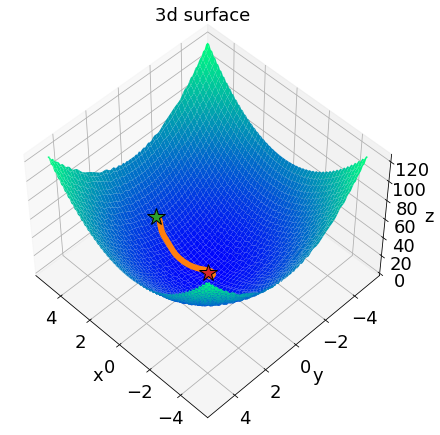

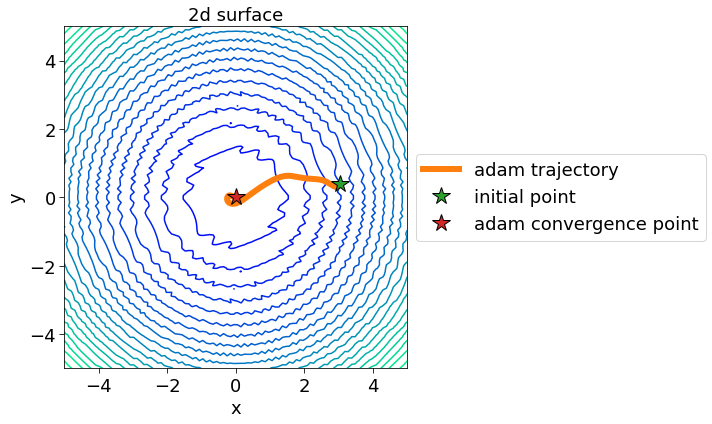

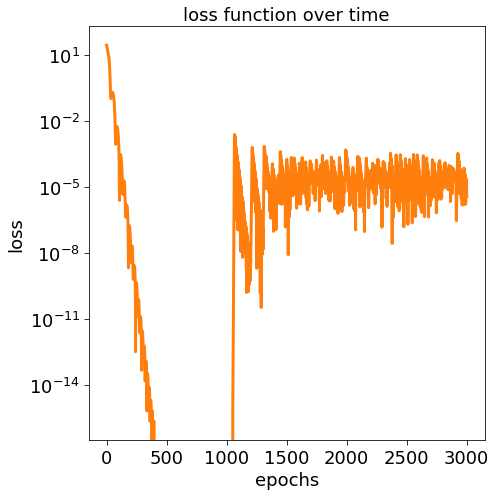

In [ ]:
## PLOT SURFACE AND TRAJECTORY

colormap = "winter"

# 3D PLOT
fig = plt.figure(figsize=(6,6))

ax1 = plot_utils.plot_surf_3d(
    X, Y, Z, fig, 
    subplot_id = 111,
    azim       = 135, 
    elev       = 50, 
    dist       = 10,
    cmap       = colormap, 
    title      = "3d surface"
)
plot_utils.overlay_trajectory_3d(
    ax         = ax1, 
    surface    = surfaces.weird_paraboloid, 
    trajectory = traj, 
    color      = "tab:orange", 
    color_i    = "tab:green", 
    color_f    = "tab:red", 
    lw         = 6, 
)

fig.tight_layout()
plt.show()

# 2D PLOT
fig = plt.figure(figsize=(10,6))

ax2 = plot_utils.plot_surf_2d(
    X, Y, Z, fig, 
    subplot_id = 111, 
    levels     = 20,
    cmap       = colormap, 
    title      = "2d surface"
)
plot_utils.overlay_trajectory_2d(
    ax         = ax2, 
    trajectory = traj, 
    color      = "tab:orange",
    color_i    = "tab:green", 
    color_f    = "tab:red",
    lw         = 6,
    label      = "adam trajectory",
    label_i    = "initial point",
    label_f    = "adam convergence point"
)
# uncomment to zoom the contour plot in the broken region
# ax2.set_xlim(-1, 1)
# ax2.set_ylim(-1, 1)

# legend outside plot
ax2.legend(loc="center left", bbox_to_anchor=(1, 0.5), fontsize=18)

fig.tight_layout()
plt.show()


# LOSS PLOT
fig = plt.figure(figsize=(7,7))

ax  = plot_utils.plot_loss(loss=loss, n_epochs=n_epochs, fig=fig, color="tab:orange", title="loss function over time")
fig.tight_layout()
plt.show()

With this non-trivial surface it can be observed that ADAM algorithm starts to become unstable with respect to a minimum that was reached at some earlier iteration t. This  is solved with the ADAMAX algorithm.

In [ ]:
#### TEST WITH DIFFERENT LEARNING RATES
np.random.seed(666)


# N sup-iterations of ADAM with different initial points, for each sup-iteration M sub.iteration with different etas
N = 5 # N different initial point
M = 3 # M different learning rates

# initial point sampling grid
min_init_grid = -4
max_init_grid = 4

# initial points sampling
init_points = np.random.randn(N, 2)%(max_init_grid-min_init_grid)+min_init_grid

# learning rates
etas = [10**-1, 10**-2, 10**-3]

# adam parameters
n_epochs = 3 * 10**3
beta1    = 0.90 # default 0.90
beta2    = 0.99 # default 0.99

trajectories = []


# fig = plt.figure(figsize=(24,16))

# for each starting point
for i in range(N):
    # for each learning rate
    for j in range(M):

        # run adam
        traj_ = algorithms.adam(
            grad     = surfaces.weird_paraboloid_grad, 
            init     = init_points[i], 
            n_epochs = n_epochs,
            eta      = etas[j],
            gamma    = beta1,
            beta     = beta2
        )

        # save trajectory
        trajectories.append(traj_) 

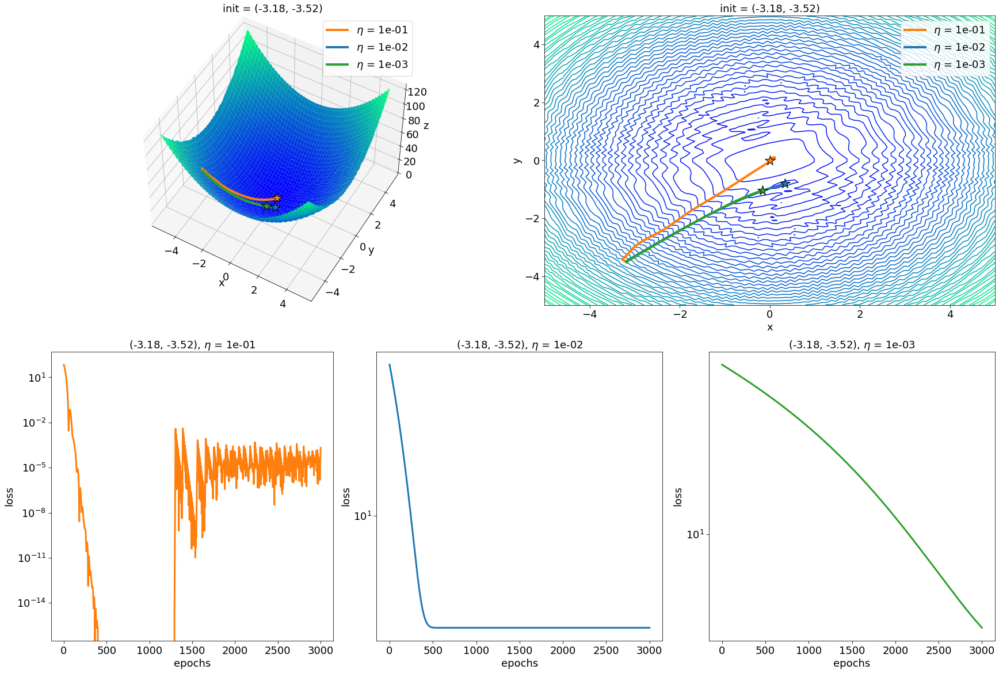

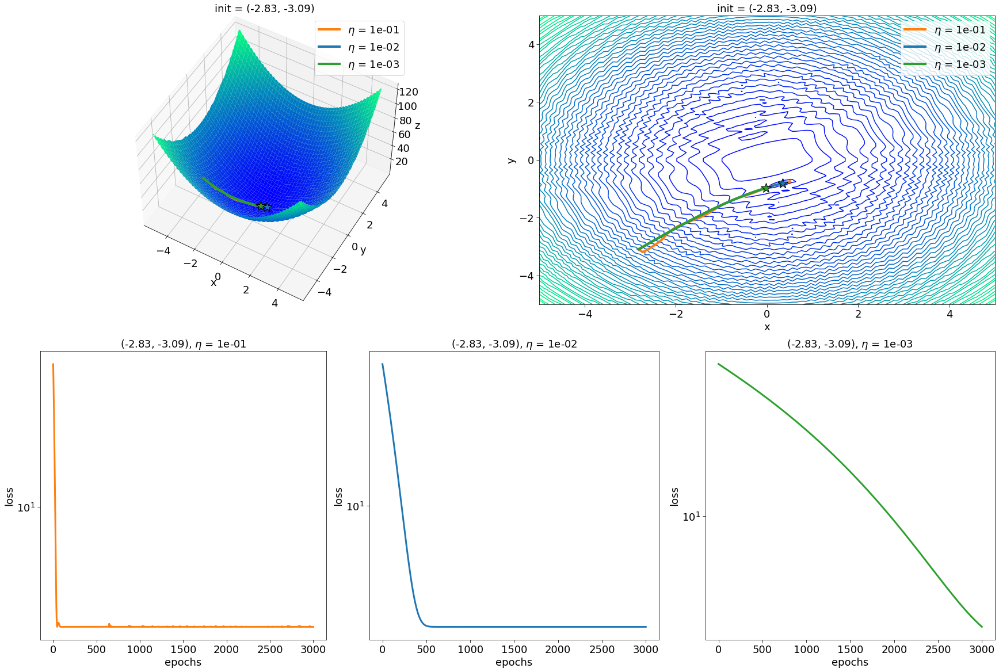

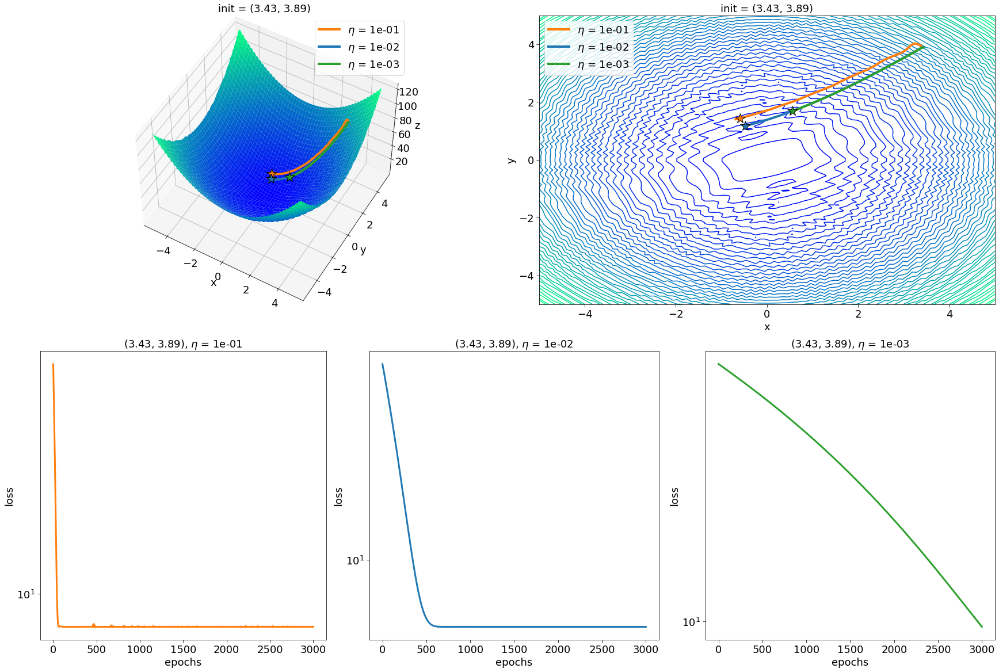

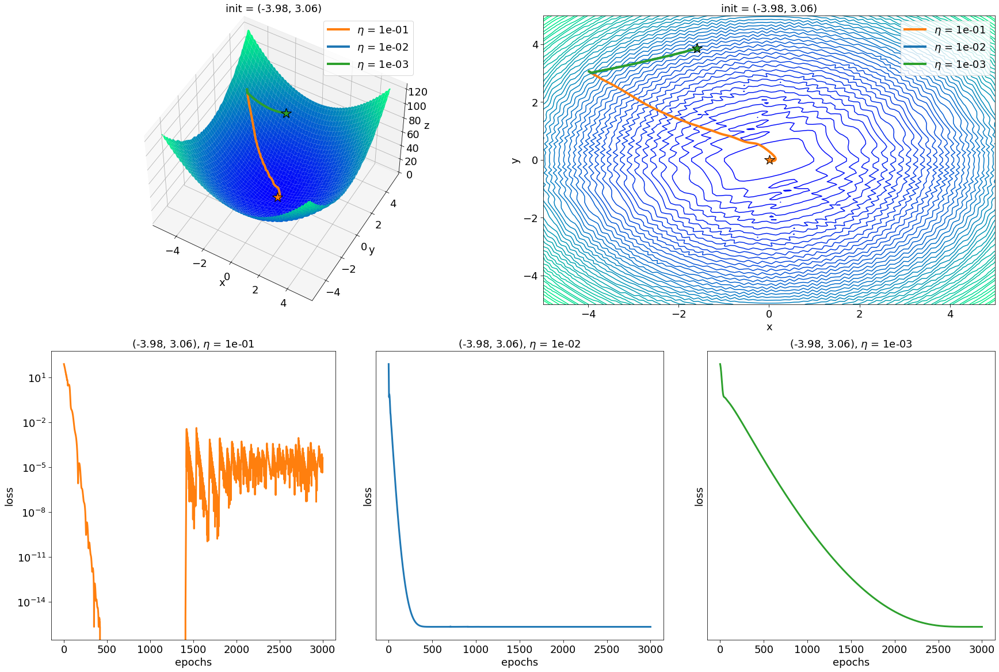

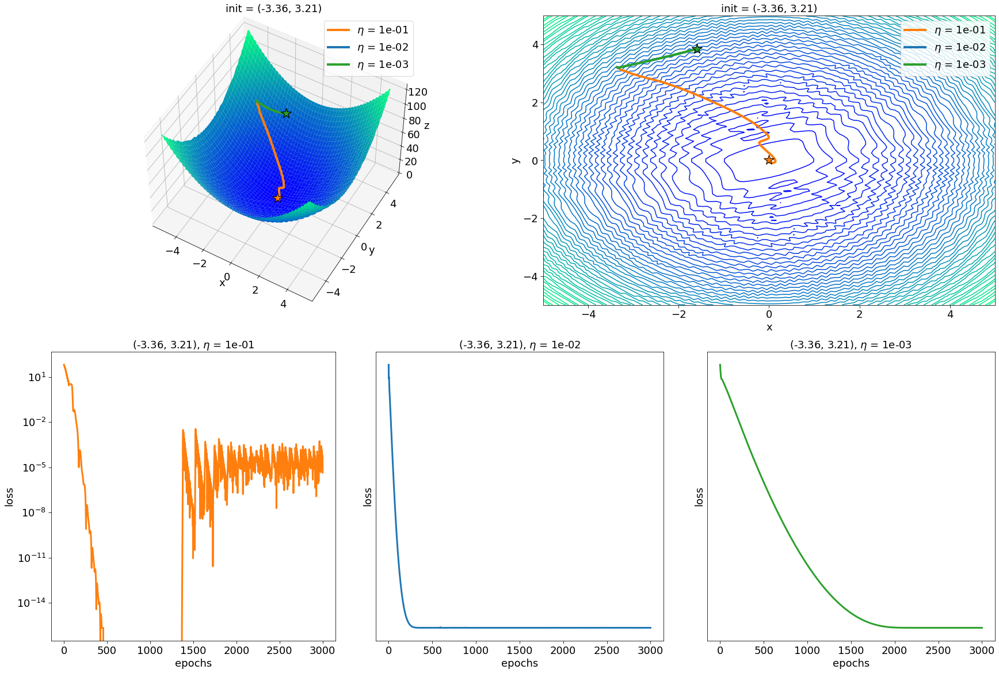

In [ ]:
# better visualization case by case 

colors = ["tab:orange", "tab:blue", "tab:green"]
colormap = "winter"

# for each initial point
for i in range(N):

    fig = plt.figure(figsize=(24,72), constrained_layout=True)
    gs = GridSpec(10, 6, figure=fig)

    # plot 3d
    ax_3d = plot_utils.plot_surf_3d(
      X, Y, Z, 
      fig, 
      elev=50, 
      cmap=colormap, 
      subplot_id=gs[2*i, :3], 
      title=r"init = (%.2f, %.2f)" % (init_points[i][0], init_points[i][1])
    )


    # plot 2d
    ax_2d = plot_utils.plot_surf_2d(
      X, Y, Z, 
      fig, 
      cmap=colormap, 
      subplot_id=gs[2*i, 3:], 
      title=r"init = (%.2f, %.2f)" % (init_points[i][0], init_points[i][1])
    )


    for j in range(M):
      plot_utils.overlay_trajectory_3d(
        ax=ax_3d, 
        surface=surfaces.weird_paraboloid, 
        trajectory=trajectories[i*M+j],
        color=colors[j], 
        lw=4,
        show_i = False,
        color_f = colors[j],
        label=r"$\eta$ = %.0e" % (etas[j]),
        label_f = None,
      )
      plot_utils.overlay_trajectory_2d(
        ax=ax_2d, 
        trajectory=trajectories[i*M+j],
        color=colors[j], 
        lw=4, 
        label=r"$\eta$ = %.0e" % (etas[j]),
        show_i=False,
        color_f = colors[j],
        label_f = None,
      )
  
      loss_ = surfaces.weird_paraboloid(trajectories[i*M+j][:,0],trajectories[i*M+j][:,1])
      ax_loss  = plot_utils.plot_loss(
            loss=loss_, 
            n_epochs=n_epochs, 
            fig=fig, 
            subplot_id=gs[2*i+1, 2*j:2*j+2], 
            title=r"(%.2f, %.2f), $\eta$ = %.0e" % (init_points[i][0], init_points[i][1], etas[j]),
            color = colors[j]
        )
    ax_3d.legend(fontsize=18)
    ax_2d.legend(fontsize=18)
    plt.show()

### ADAM vs ADAMAX comparison

In [ ]:
## ADAMAX on previous points
alpha = 10**-3
trajectories_adamax = []

for i in range(N):
    traj_ = algorithms.adamax(
        grad     = surfaces.weird_paraboloid_grad, 
        init     = init_points[i], 
        n_epochs = n_epochs,
        # eta      = etas[j],
        beta1    = beta1,
        beta2    = beta2,
        alpha    = alpha
    )
    trajectories_adamax.append(traj_)

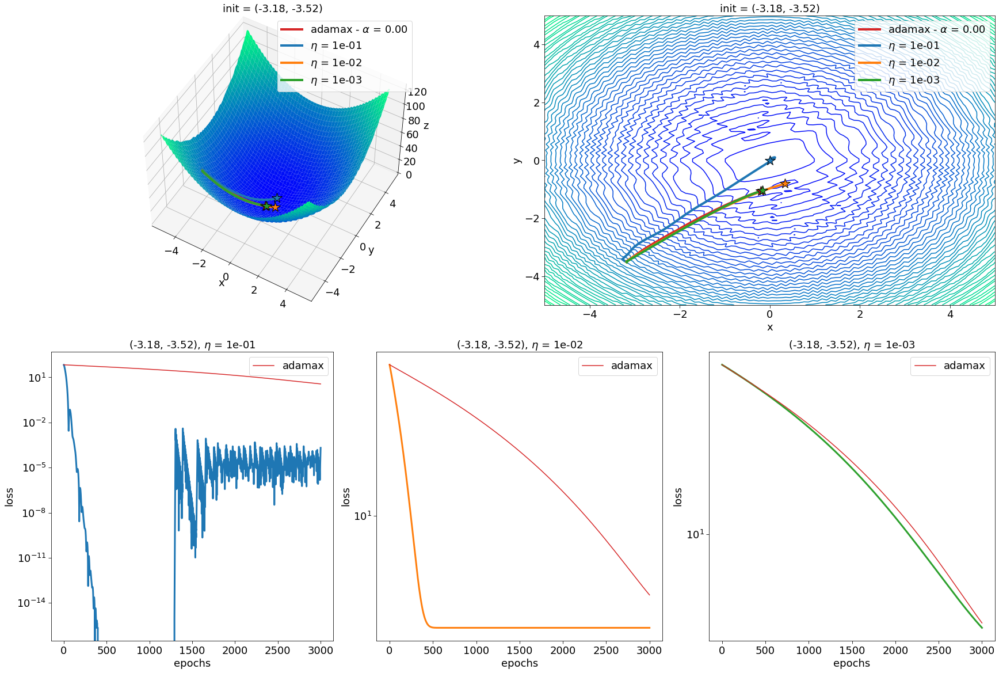

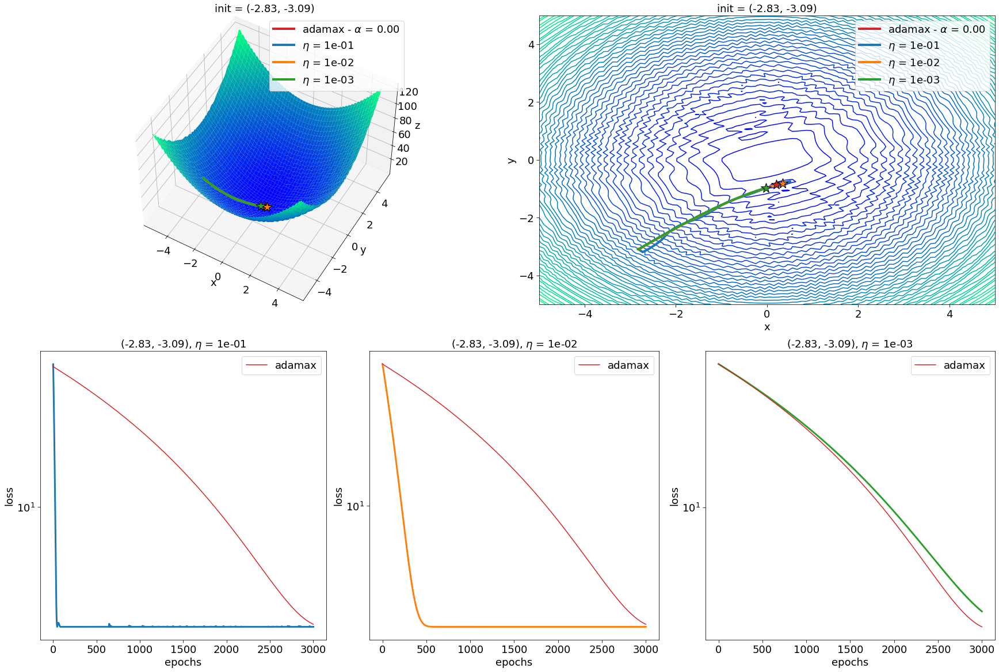

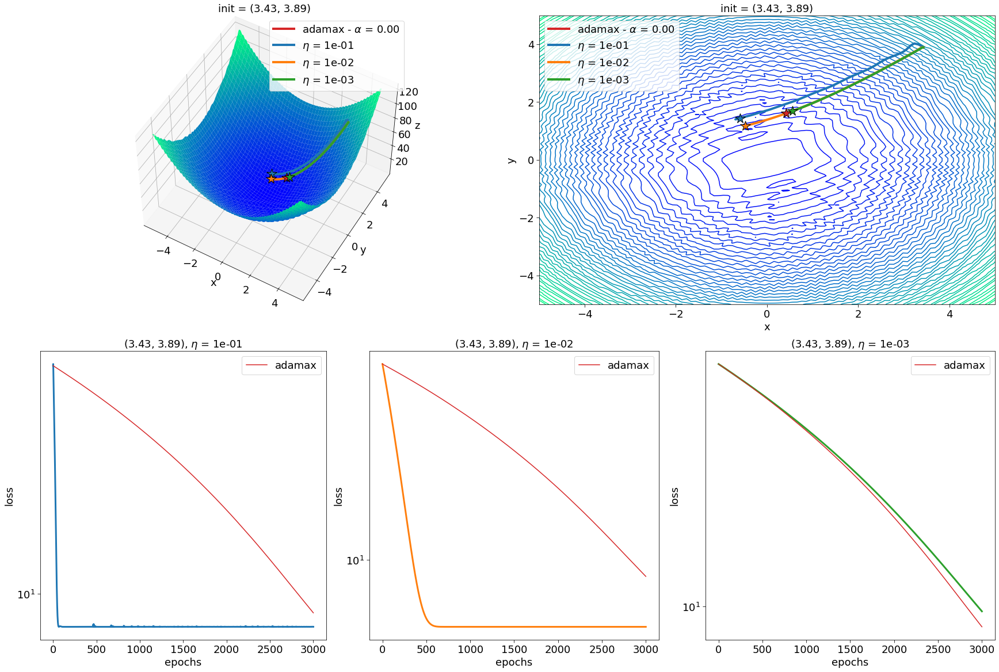

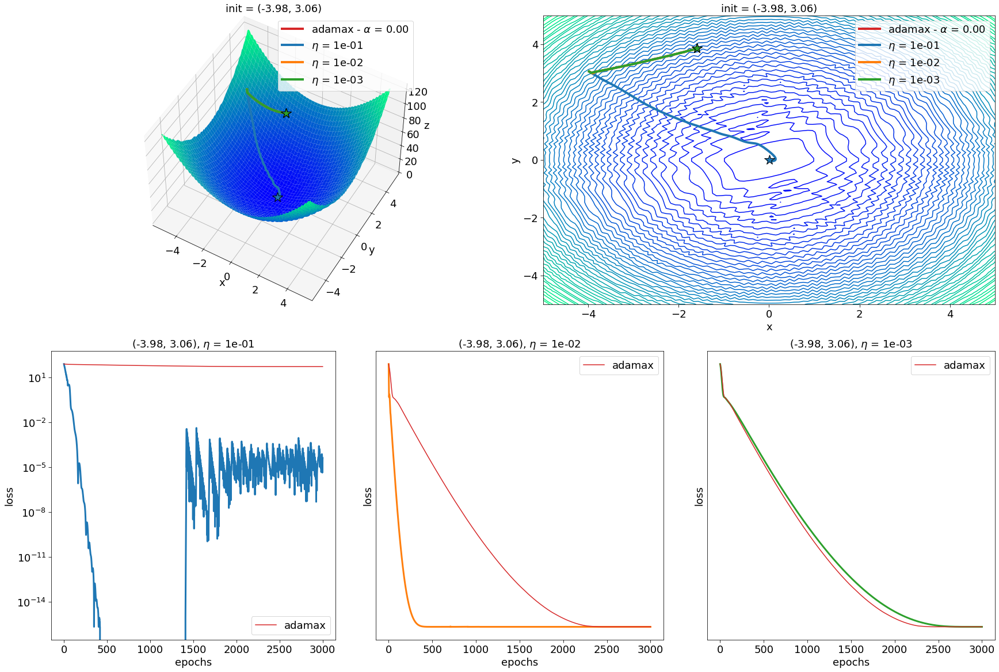

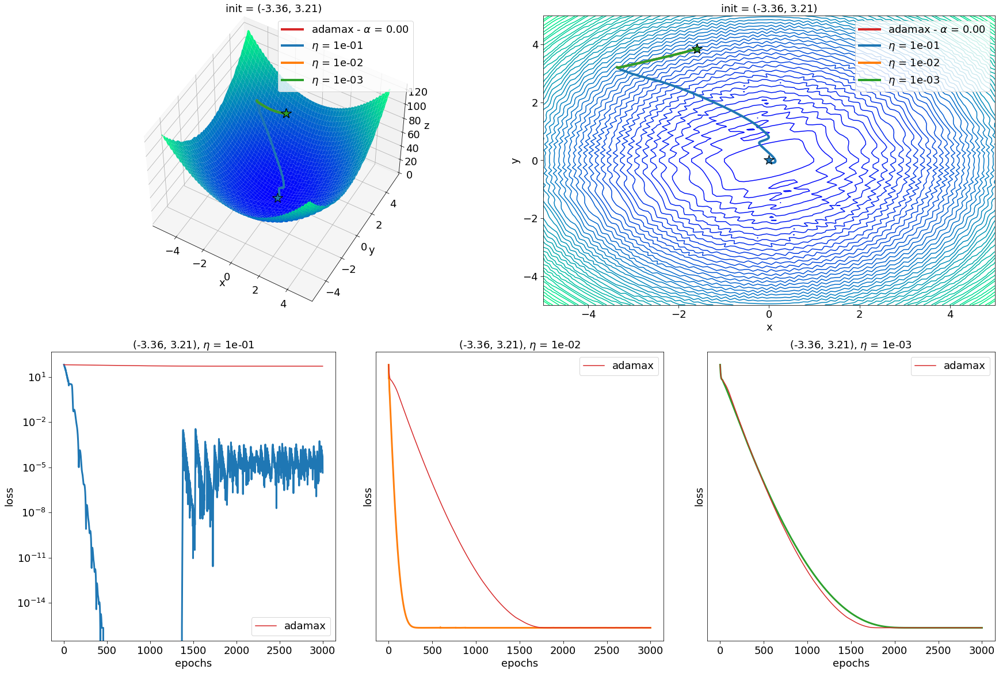

In [ ]:
# plot comparison with ADAM

colors = ["tab:blue", "tab:orange", "tab:green", "tab:red"]

for i in range(N):

    fig = plt.figure(figsize=(24,72), constrained_layout=True)
    gs = GridSpec(10, 6, figure=fig)

    # plot 3d
    ax_3d = plot_utils.plot_surf_3d(
      X, Y, Z, 
      fig, 
      elev=50, 
      cmap=colormap, 
      subplot_id=gs[2*i, :3], 
      title=r"init = (%.2f, %.2f)" % (init_points[i][0], init_points[i][1])
    )


    # plot 2d
    ax_2d = plot_utils.plot_surf_2d(
      X, Y, Z, 
      fig, 
      cmap=colormap, 
      subplot_id=gs[2*i, 3:], 
      title=r"init = (%.2f, %.2f)" % (init_points[i][0], init_points[i][1])
    )

    # compute adamax loss
    loss_adamax = surfaces.weird_paraboloid(trajectories_adamax[i][:,0],trajectories_adamax[i][:,1])

    # adamax trajectory 3d
    plot_utils.overlay_trajectory_3d(
        ax=ax_3d, 
        surface=surfaces.weird_paraboloid, 
        trajectory=trajectories_adamax[i],
        color=colors[3], 
        lw=4,
        show_i = False,
        color_f = colors[3],
        label=r"adamax - $\alpha$ = %.2f" % (alpha),
        label_f=None
    )

    # adamax trajectory 2d
    plot_utils.overlay_trajectory_2d(
        ax=ax_2d, 
        trajectory=trajectories_adamax[i],
        color=colors[3], 
        lw=4, 
        label=r"adamax - $\alpha$ = %.2f" % (alpha),
        show_i=False,
        color_f = colors[3],
        label_f=None
      )
    
    # for each learning rate
    for j in range(M):

      # adam trajectory 2d
      plot_utils.overlay_trajectory_3d(
        ax=ax_3d, 
        surface=surfaces.weird_paraboloid, 
        trajectory=trajectories[i*M+j],
        color=colors[j], 
        lw=4,
        show_i = False,
        color_f = colors[j],
        label=r"$\eta$ = %.0e" % (etas[j]),
        label_f=None
      )

      # adama trajectory 2d
      plot_utils.overlay_trajectory_2d(
        ax=ax_2d, 
        trajectory=trajectories[i*M+j],
        color=colors[j], 
        lw=4, 
        label=r"$\eta$ = %.0e" % (etas[j]),
        show_i=False,
        color_f = colors[j],
        label_f=None
      )

      # compute adam loss
      loss_ = surfaces.weird_paraboloid(trajectories[i*M+j][:,0],trajectories[i*M+j][:,1])

      # plot adam loss
      ax_loss  = plot_utils.plot_loss(
            loss=loss_, 
            n_epochs=n_epochs, 
            fig=fig, 
            subplot_id=gs[2*i+1, 2*j:2*j+2], 
            title=r"(%.2f, %.2f), $\eta$ = %.0e" % (init_points[i][0], init_points[i][1], etas[j]),
            color = colors[j]
        )

      # plot adamax loss
      ax_loss.plot(np.arange(0, n_epochs+1, 1), loss_adamax, color=colors[3], label="adamax")
      ax_loss.legend(fontsize=18)

    ax_3d.legend(fontsize=18)
    ax_2d.legend(fontsize=18)

<a style='text-decoration:none;line-height:16px;display:flex;color:#5B5B62;padding:10px;justify-content:end;' href='https://deepnote.com?utm_source=created-in-deepnote-cell&projectId=452e6836-b7b8-455e-80d9-d4109b6baddf' target="_blank">
 </img>
Created in <span style='font-weight:600;margin-left:4px;'>Deepnote</span></a>